# Simulation | [44,-23] Free-Free | FoV2

In [1]:
import joblib
import timeit

def savedata( name, obj ):
    tic=timeit.default_timer()
    with open( name,'wb' ) as Gv:
        joblib.dump( obj, Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    
def loaddata( name ):
    tic=timeit.default_timer()
    with open( name,'rb' ) as Gv:
        mydata = joblib.load( Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    return mydata

def load_Gfree_fitmap():
    Gfree_FoV2_fitmap = loaddata('Gfree_44_23_FoV2_fitmap.db')
    Gfree_FoV4_fitmap = loaddata('Gfree_44_23_FoV4_fitmap.db')
    return Gfree_FoV4_fitmap, Gfree_FoV2_fitmap
    
def load_Gsync_fitmap():
    Gsync_FoV2_fitmap = loaddata('Gsync_44_23_FoV2_fitmap.db')
    Gsync_FoV4_fitmap = loaddata('Gsync_44_23_FoV4_fitmap.db')
    return Gsync_FoV4_fitmap, Gsync_FoV2_fitmap

def load_Gfree_simmap():
    Fov4patch_map = loaddata('Gfree_44_23_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gfree_44_23_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gfree_44_23_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gfree_44_23_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

def load_Gsync_simmap():
    Fov4patch_map = loaddata('Gsync_44_23_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gsync_44_23_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gsync_44_23_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gsync_44_23_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

In [2]:
import pickle
from MCMC import MCMC
%matplotlib inline
from GalacticDev import GalacticDev

In [3]:
from GalacticCore import *
from astropy.io import fits

### Load maps

In [4]:
SF4_map, SF4_gss, SF2_map, SF2_gss = load_Gfree_simmap()

0.8275446631014347
0.828576423227787
0.20775546319782734
0.20771881751716137


In [5]:
SF4_fitmap, SF2_fitmap = load_Gfree_fitmap()

0.04539324343204498
0.16187765076756477


#### Set-up gss-map

In [6]:
fov2grf = {}
fov2grf['fit'] = whiten(SF2_fitmap['gss'])
fov2grf['sim'] = whiten(SF2_gss)

In [7]:
fov4grf = {}
fov4grf['fit'] = whiten(SF4_fitmap['gss'])
fov4grf['sim'] = whiten(SF4_gss)

### FoV2x2

In [8]:
Sfov2 = GalacticDev( comp='Gfree', nside=32768, use_G02=True, extra_large_mode=True, center=( 44,-23 ), grfmap=fov2grf, grfpatch=True, fov = ( 2, 2 ), sim_pixel = 2, default=True )

2022-08-13 15:11:43,350 : createlog : INFO : Log Header >> Action Time : Fuction or method: level : Message
2022-08-13 15:11:43,352 : createlog : INFO : Log standard output streaming is False
2022-08-13 15:11:43,353 : createlog : INFO : GSim_Gfree_Default_True_08_13_2022_151143.log log file is created
2022-08-13 15:11:43,354 : createlog : INFO : Log is created by cxshan
2022-08-13 15:11:43,355 : createlog : INFO : Log level is debug
2022-08-13 15:11:43,356 : __init__ : INFO :  ⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇ 
2022-08-13 15:11:43,357 : __init__ : INFO :  Galactic Gfree simulation is initializing! 
2022-08-13 15:11:43,358 : __init__ : WARNING :  sigma_tem default unit is [arcmin]! 
2022-08-13 15:11:43,359 : _set_comp : INFO : compID is galactic/freefree, name is Galactic free-free
2022-08-13 15:11:43,360 : _set_default_io : INFO : Default IO is set. Output dir is /home/cxshan/data/fg21sim+/GalacticSimData/, clobber is True.
2022-08-13 15:11:43,361 : _set_default_params : INFO :  Default settings ar

 Please update the healpix maps when you need to. 


In [9]:
Sfov2.set_gamma(-2.42645582)

2022-08-13 15:11:44,319 : set_gamma : INFO :  gamma is set as -2.42645582 


In [10]:
Sfov2.set_alpha(0.004061939488443293)
Sfov2.set_beta(0.27615600152130587)

2022-08-13 15:11:44,340 : set_alpha : INFO :  alpha is set as 0.004061939488443293 
2022-08-13 15:11:44,341 : set_beta : INFO :  beta is set as 0.27615600152130587 


#### Set up frequency simulation

In [11]:
Sfov2._set_up_freq()

2022-08-13 15:11:44,382 : gen_simmap : INFO : Using mask filled map to generate simulation image.
2022-08-13 15:12:22,188 : gen_simmap : INFO :  Finish generating the original image for simulation, using 37.80535210110247 s.
2022-08-13 15:12:22,192 : gen_simmap : INFO : Input patch flag detected. Using user input GRF patch for simulation.
2022-08-13 15:12:22,806 : _set_physical_params : INFO :  Physical params are set. 


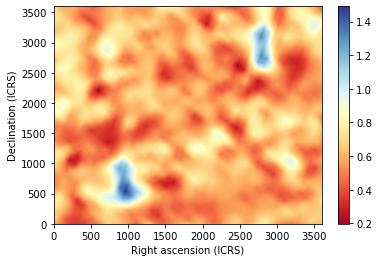

In [12]:
Sfov2.viewslice(Sfov2.patch_map)

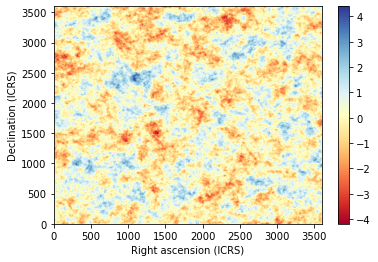

In [13]:
Sfov2.viewslice(Sfov2.patch_gss)

In [14]:
smoothed_input_map = Sfov2.smooth_sky(0.6, Sfov2.skypatch)

2022-08-13 15:12:28,687 : smooth_sky : INFO : Smoothing the <Ut.sky.SkyPatch object at 0x7ffff07209d0> with a Gaussian filter ...
2022-08-13 15:12:42,012 : smooth_sky : INFO : Smoothed sky patch using Gaussian filter of sigma = 108.00 [pixel]


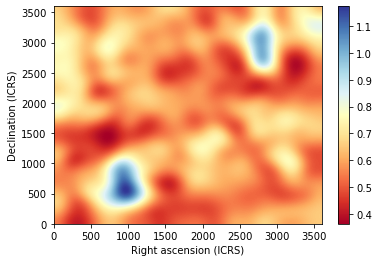

In [15]:
Sfov2.viewslice(smoothed_input_map)

In [16]:
Sfov2.skypatch.data = smoothed_input_map

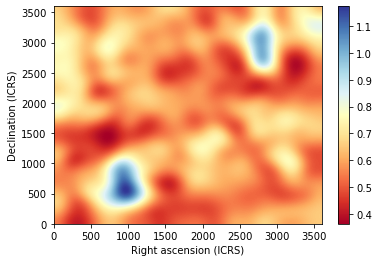

In [17]:
Sfov2.viewslice(Sfov2.skypatch.data)

In [18]:
Sfov2.filename_pattern = '{prefix}_fov4_44-23_{frequency:06.2f}.fits'

In [19]:
Sfov2.filename_pattern

'{prefix}_fov4_44-23_{frequency:06.2f}.fits'

### Simulate one freq

In [20]:
F158 = Sfov2.simulate_frequency(158,skytype='patch')

2022-08-13 15:12:47,993 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.00 [MHz] ...
2022-08-13 15:12:48,580 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:12:50,754 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].


In [21]:
F158.data[0:100,0:100].shape

(100, 100)

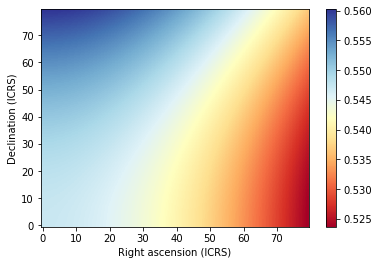

In [22]:
Sfov2.viewslice(smoothed_input_map[0:80,0:80])

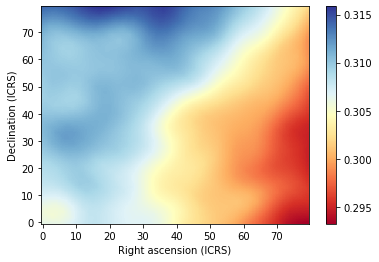

In [23]:
Sfov2.viewslice(F158.data[0:80,0:80])

### Simulate full freq bands

In [24]:
def do_simulation( freqlist, T, outdir ):
    T.output_dir = outdir
    for i in freqlist:
        sky = T.simulate(i, skytype='patch', smooth=False)
        print(sky)
        hdu = fits.open(sky[0])
        T.viewslice(hdu[0].data)

In [25]:
fov2_outhig = '/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196'
fov2_outmid = '/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162'
fov2_outlow = '/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128'

##### Low band

2022-08-13 15:23:30,493 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:23:30,495 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.00 [MHz] ...
2022-08-13 15:23:31,121 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:23:33,325 : simulate_frequency : INFO : Done simulate map at 120.00 [MHz].
2022-08-13 15:23:33,662 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_120.00.fits']


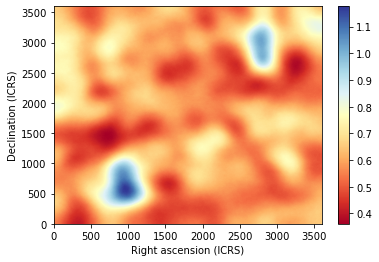

2022-08-13 15:23:36,491 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:23:36,493 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.16 [MHz] ...
2022-08-13 15:23:37,159 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:23:39,459 : simulate_frequency : INFO : Done simulate map at 120.16 [MHz].
2022-08-13 15:23:39,779 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_120.16.fits']


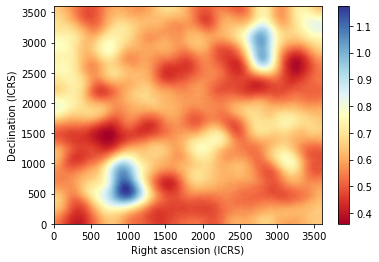

2022-08-13 15:23:42,003 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:23:42,004 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.32 [MHz] ...
2022-08-13 15:23:42,629 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:23:44,847 : simulate_frequency : INFO : Done simulate map at 120.32 [MHz].
2022-08-13 15:23:45,188 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_120.32.fits']


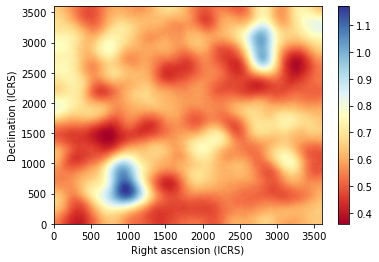

2022-08-13 15:23:47,344 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:23:47,346 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.48 [MHz] ...
2022-08-13 15:23:47,940 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:23:50,171 : simulate_frequency : INFO : Done simulate map at 120.48 [MHz].
2022-08-13 15:23:50,476 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_120.48.fits']


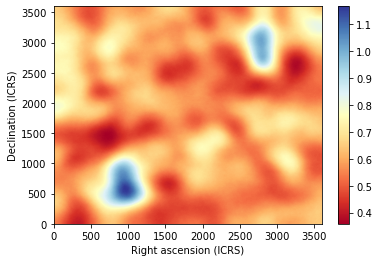

2022-08-13 15:23:52,622 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:23:52,624 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.64 [MHz] ...
2022-08-13 15:23:53,264 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:23:55,514 : simulate_frequency : INFO : Done simulate map at 120.64 [MHz].
2022-08-13 15:23:55,814 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_120.64.fits']


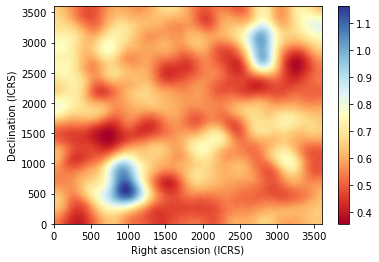

2022-08-13 15:23:57,948 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:23:57,950 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.80 [MHz] ...
2022-08-13 15:23:58,545 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:24:00,778 : simulate_frequency : INFO : Done simulate map at 120.80 [MHz].
2022-08-13 15:24:01,127 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_120.80.fits']


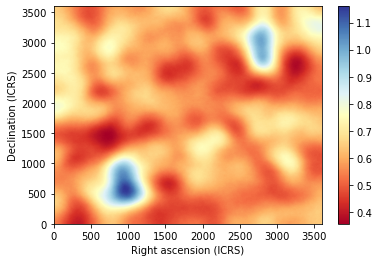

2022-08-13 15:24:03,282 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:03,283 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.96 [MHz] ...
2022-08-13 15:24:03,867 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:24:06,050 : simulate_frequency : INFO : Done simulate map at 120.96 [MHz].
2022-08-13 15:24:06,346 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_120.96.fits']


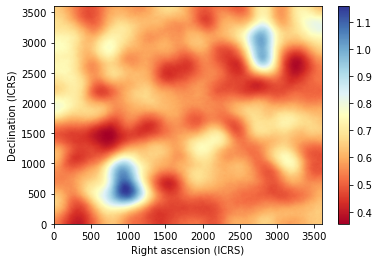

2022-08-13 15:24:08,535 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:08,537 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.12 [MHz] ...
2022-08-13 15:24:09,130 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:24:11,300 : simulate_frequency : INFO : Done simulate map at 121.12 [MHz].
2022-08-13 15:24:11,642 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_121.12.fits']


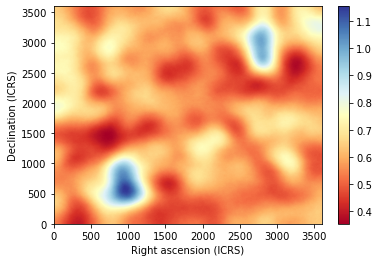

2022-08-13 15:24:13,798 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:13,799 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.28 [MHz] ...
2022-08-13 15:24:14,436 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:24:16,633 : simulate_frequency : INFO : Done simulate map at 121.28 [MHz].
2022-08-13 15:24:16,931 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_121.28.fits']


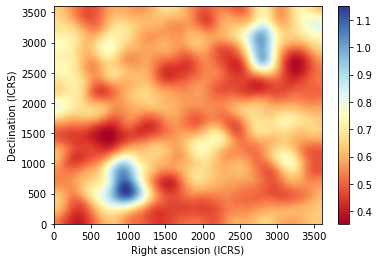

2022-08-13 15:24:19,068 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:19,069 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.44 [MHz] ...
2022-08-13 15:24:19,668 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:24:21,902 : simulate_frequency : INFO : Done simulate map at 121.44 [MHz].
2022-08-13 15:24:22,206 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_121.44.fits']


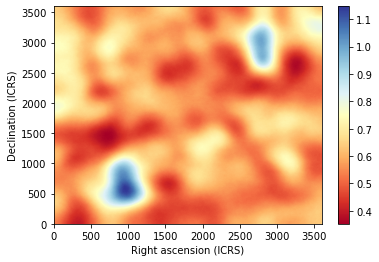

2022-08-13 15:24:24,366 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:24,367 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.60 [MHz] ...
2022-08-13 15:24:24,989 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:24:27,232 : simulate_frequency : INFO : Done simulate map at 121.60 [MHz].
2022-08-13 15:24:27,530 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_121.60.fits']


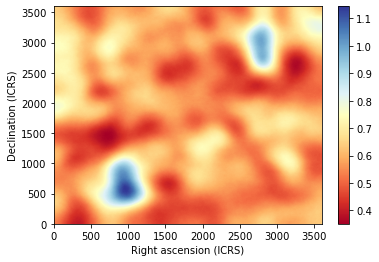

2022-08-13 15:24:29,671 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:29,672 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.76 [MHz] ...
2022-08-13 15:24:30,256 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:24:32,456 : simulate_frequency : INFO : Done simulate map at 121.76 [MHz].
2022-08-13 15:24:32,774 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_121.76.fits']


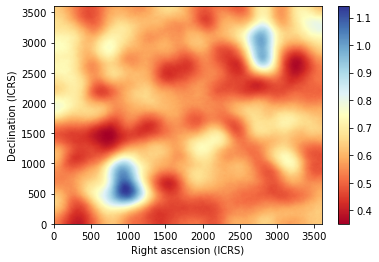

2022-08-13 15:24:35,613 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:35,614 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.92 [MHz] ...
2022-08-13 15:24:36,216 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:24:38,394 : simulate_frequency : INFO : Done simulate map at 121.92 [MHz].
2022-08-13 15:24:38,697 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_121.92.fits']


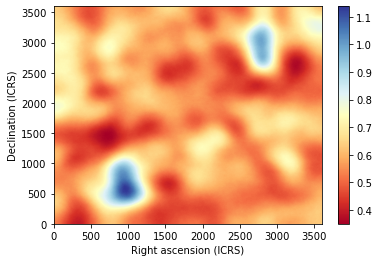

2022-08-13 15:24:40,943 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:40,944 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.08 [MHz] ...
2022-08-13 15:24:41,567 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:24:43,807 : simulate_frequency : INFO : Done simulate map at 122.08 [MHz].
2022-08-13 15:24:44,124 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_122.08.fits']


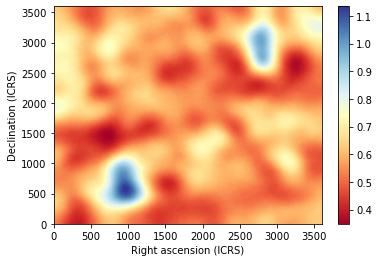

2022-08-13 15:24:46,309 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:46,310 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.24 [MHz] ...
2022-08-13 15:24:46,963 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:24:49,187 : simulate_frequency : INFO : Done simulate map at 122.24 [MHz].
2022-08-13 15:24:49,501 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_122.24.fits']


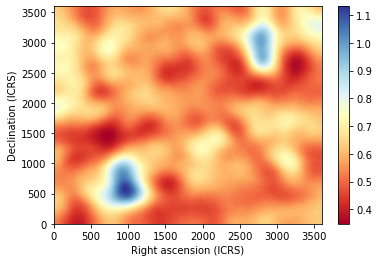

2022-08-13 15:24:51,656 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:51,658 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.40 [MHz] ...
2022-08-13 15:24:52,258 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:24:54,472 : simulate_frequency : INFO : Done simulate map at 122.40 [MHz].
2022-08-13 15:24:54,800 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_122.40.fits']


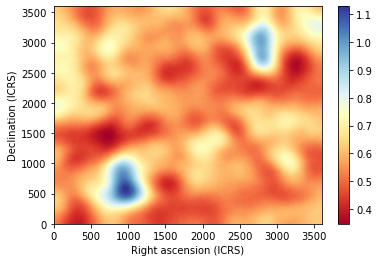

2022-08-13 15:24:57,016 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:57,018 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.56 [MHz] ...
2022-08-13 15:24:57,651 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:24:59,879 : simulate_frequency : INFO : Done simulate map at 122.56 [MHz].
2022-08-13 15:25:00,225 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_122.56.fits']


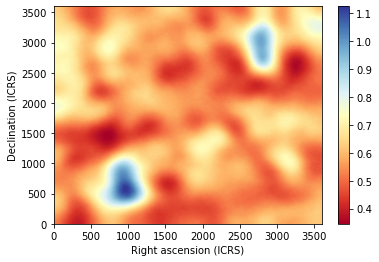

2022-08-13 15:25:02,422 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:02,423 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.72 [MHz] ...
2022-08-13 15:25:03,034 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:25:05,194 : simulate_frequency : INFO : Done simulate map at 122.72 [MHz].
2022-08-13 15:25:05,489 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_122.72.fits']


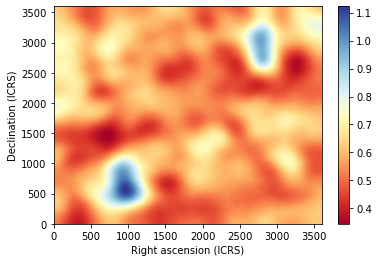

2022-08-13 15:25:07,657 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:07,658 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.88 [MHz] ...
2022-08-13 15:25:08,274 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:25:10,428 : simulate_frequency : INFO : Done simulate map at 122.88 [MHz].
2022-08-13 15:25:10,736 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_122.88.fits']


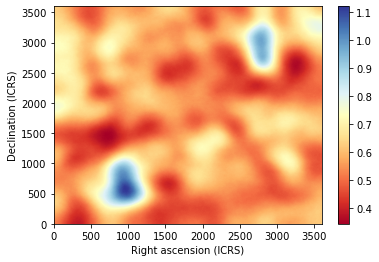

2022-08-13 15:25:12,912 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:12,914 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.04 [MHz] ...
2022-08-13 15:25:13,536 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:25:15,724 : simulate_frequency : INFO : Done simulate map at 123.04 [MHz].
2022-08-13 15:25:16,028 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_123.04.fits']


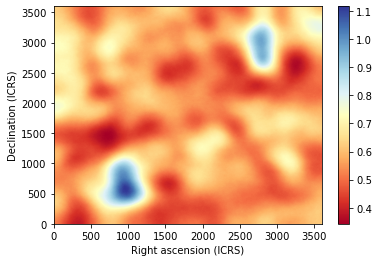

2022-08-13 15:25:18,169 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:18,171 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.20 [MHz] ...
2022-08-13 15:25:18,765 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:25:20,990 : simulate_frequency : INFO : Done simulate map at 123.20 [MHz].
2022-08-13 15:25:21,292 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_123.20.fits']


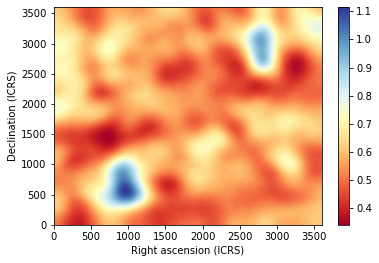

2022-08-13 15:25:23,438 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:23,440 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.36 [MHz] ...
2022-08-13 15:25:24,075 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:25:26,317 : simulate_frequency : INFO : Done simulate map at 123.36 [MHz].
2022-08-13 15:25:26,613 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_123.36.fits']


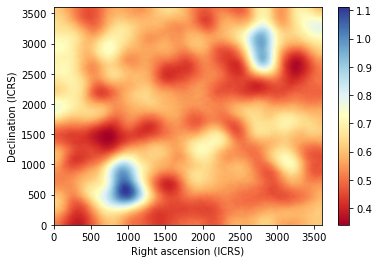

2022-08-13 15:25:28,767 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:28,768 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.52 [MHz] ...
2022-08-13 15:25:29,372 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:25:31,552 : simulate_frequency : INFO : Done simulate map at 123.52 [MHz].
2022-08-13 15:25:31,856 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_123.52.fits']


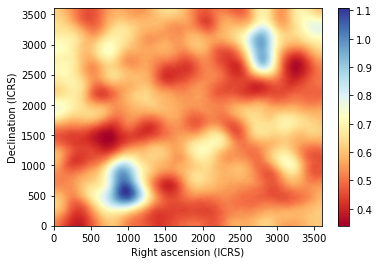

2022-08-13 15:25:34,704 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:34,705 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.68 [MHz] ...
2022-08-13 15:25:35,307 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:25:37,499 : simulate_frequency : INFO : Done simulate map at 123.68 [MHz].
2022-08-13 15:25:37,803 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_123.68.fits']


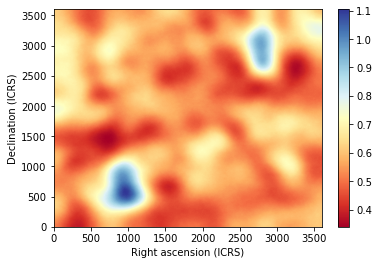

2022-08-13 15:25:40,006 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:40,007 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.84 [MHz] ...
2022-08-13 15:25:40,650 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:25:42,820 : simulate_frequency : INFO : Done simulate map at 123.84 [MHz].
2022-08-13 15:25:43,137 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_123.84.fits']


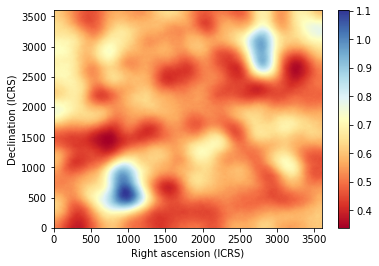

2022-08-13 15:25:45,323 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:45,324 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.00 [MHz] ...
2022-08-13 15:25:45,952 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:25:48,148 : simulate_frequency : INFO : Done simulate map at 124.00 [MHz].
2022-08-13 15:25:48,446 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_124.00.fits']


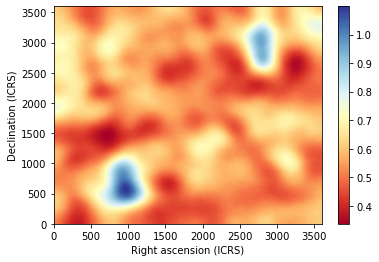

2022-08-13 15:25:50,614 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:50,615 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.16 [MHz] ...
2022-08-13 15:25:51,192 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:25:53,473 : simulate_frequency : INFO : Done simulate map at 124.16 [MHz].
2022-08-13 15:25:53,819 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_124.16.fits']


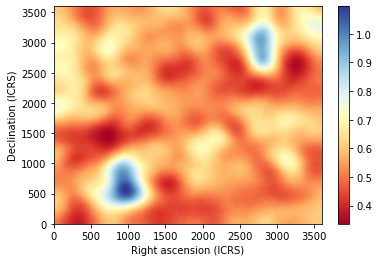

2022-08-13 15:25:56,035 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:56,036 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.32 [MHz] ...
2022-08-13 15:25:56,654 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:25:58,909 : simulate_frequency : INFO : Done simulate map at 124.32 [MHz].
2022-08-13 15:25:59,252 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_124.32.fits']


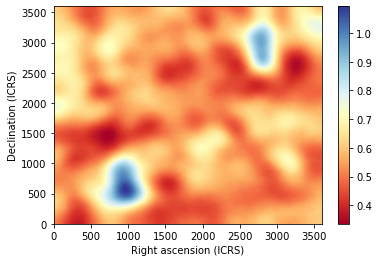

2022-08-13 15:26:01,452 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:01,453 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.48 [MHz] ...
2022-08-13 15:26:02,069 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:26:04,234 : simulate_frequency : INFO : Done simulate map at 124.48 [MHz].
2022-08-13 15:26:04,530 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_124.48.fits']


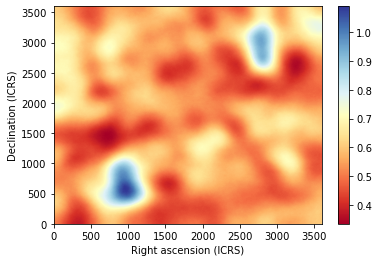

2022-08-13 15:26:06,697 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:06,698 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.64 [MHz] ...
2022-08-13 15:26:07,321 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:26:09,486 : simulate_frequency : INFO : Done simulate map at 124.64 [MHz].
2022-08-13 15:26:09,792 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_124.64.fits']


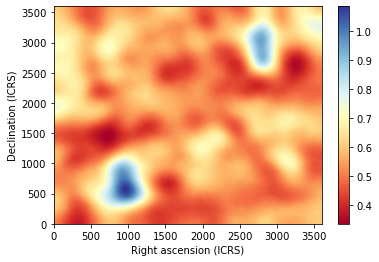

2022-08-13 15:26:11,956 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:11,958 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.80 [MHz] ...
2022-08-13 15:26:12,584 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:26:14,762 : simulate_frequency : INFO : Done simulate map at 124.80 [MHz].
2022-08-13 15:26:15,056 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_124.80.fits']


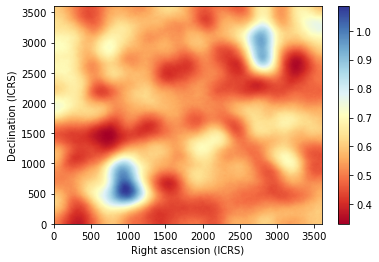

2022-08-13 15:26:17,207 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:17,208 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.96 [MHz] ...
2022-08-13 15:26:17,800 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:26:20,020 : simulate_frequency : INFO : Done simulate map at 124.96 [MHz].
2022-08-13 15:26:20,335 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_124.96.fits']


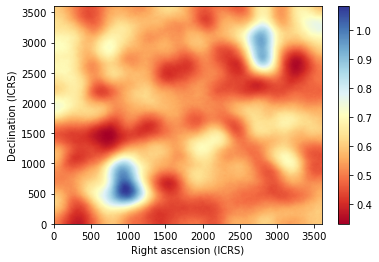

2022-08-13 15:26:22,482 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:22,484 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.12 [MHz] ...
2022-08-13 15:26:23,091 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:26:25,322 : simulate_frequency : INFO : Done simulate map at 125.12 [MHz].
2022-08-13 15:26:25,620 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_125.12.fits']


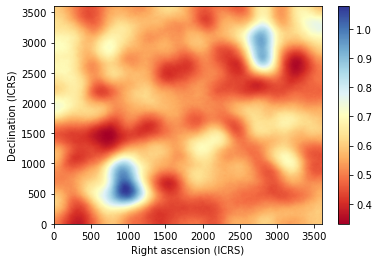

2022-08-13 15:26:27,760 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:27,761 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.28 [MHz] ...
2022-08-13 15:26:28,332 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:26:30,519 : simulate_frequency : INFO : Done simulate map at 125.28 [MHz].
2022-08-13 15:26:30,820 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_125.28.fits']


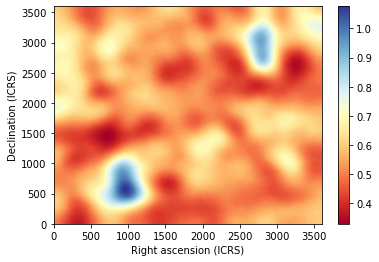

2022-08-13 15:26:33,632 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:33,634 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.44 [MHz] ...
2022-08-13 15:26:34,236 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:26:36,435 : simulate_frequency : INFO : Done simulate map at 125.44 [MHz].
2022-08-13 15:26:36,739 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_125.44.fits']


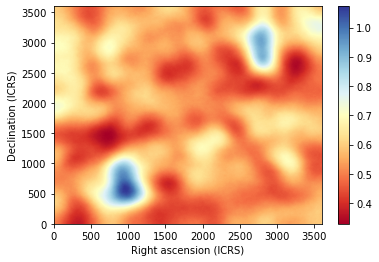

2022-08-13 15:26:38,928 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:38,929 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.60 [MHz] ...
2022-08-13 15:26:39,565 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:26:41,733 : simulate_frequency : INFO : Done simulate map at 125.60 [MHz].
2022-08-13 15:26:42,050 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_125.60.fits']


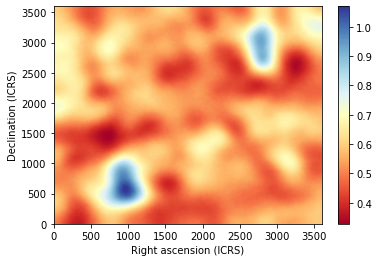

2022-08-13 15:26:44,230 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:44,232 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.76 [MHz] ...
2022-08-13 15:26:44,860 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:26:47,048 : simulate_frequency : INFO : Done simulate map at 125.76 [MHz].
2022-08-13 15:26:47,347 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_125.76.fits']


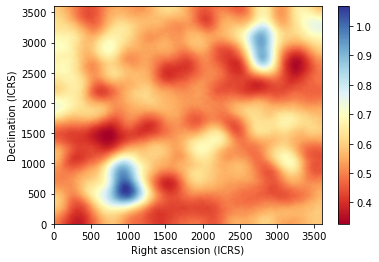

2022-08-13 15:26:49,498 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:49,499 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.92 [MHz] ...
2022-08-13 15:26:50,069 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:26:52,294 : simulate_frequency : INFO : Done simulate map at 125.92 [MHz].
2022-08-13 15:26:52,596 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_125.92.fits']


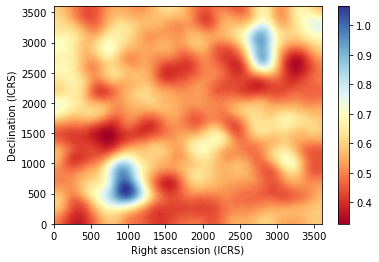

2022-08-13 15:26:54,754 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:54,756 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.08 [MHz] ...
2022-08-13 15:26:55,365 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:26:57,583 : simulate_frequency : INFO : Done simulate map at 126.08 [MHz].
2022-08-13 15:26:57,879 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_126.08.fits']


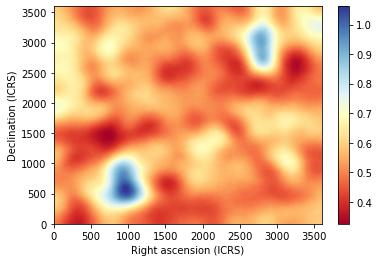

2022-08-13 15:27:00,017 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:00,018 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.24 [MHz] ...
2022-08-13 15:27:00,609 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:27:02,775 : simulate_frequency : INFO : Done simulate map at 126.24 [MHz].
2022-08-13 15:27:03,080 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_126.24.fits']


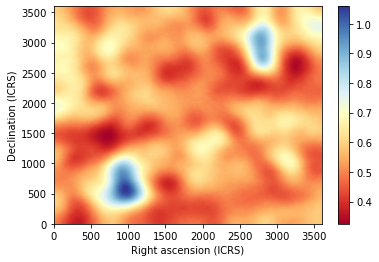

2022-08-13 15:27:05,291 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:05,292 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.40 [MHz] ...
2022-08-13 15:27:05,957 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:27:08,220 : simulate_frequency : INFO : Done simulate map at 126.40 [MHz].
2022-08-13 15:27:08,555 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_126.40.fits']


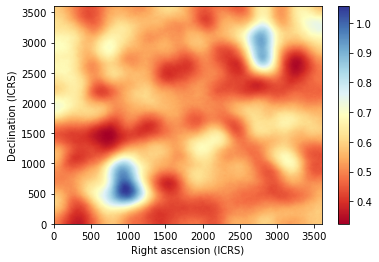

2022-08-13 15:27:10,719 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:10,720 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.56 [MHz] ...
2022-08-13 15:27:11,366 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:27:13,599 : simulate_frequency : INFO : Done simulate map at 126.56 [MHz].
2022-08-13 15:27:13,927 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_126.56.fits']


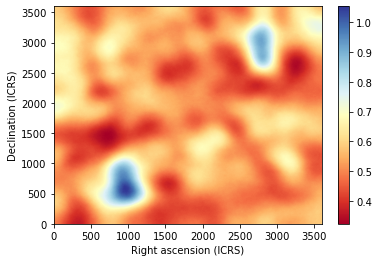

2022-08-13 15:27:16,096 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:16,098 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.72 [MHz] ...
2022-08-13 15:27:16,674 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:27:18,929 : simulate_frequency : INFO : Done simulate map at 126.72 [MHz].
2022-08-13 15:27:19,242 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_126.72.fits']


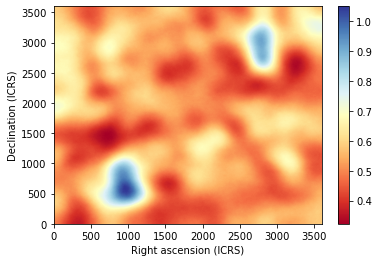

2022-08-13 15:27:21,383 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:21,384 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.88 [MHz] ...
2022-08-13 15:27:22,000 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:27:24,179 : simulate_frequency : INFO : Done simulate map at 126.88 [MHz].
2022-08-13 15:27:24,481 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_126.88.fits']


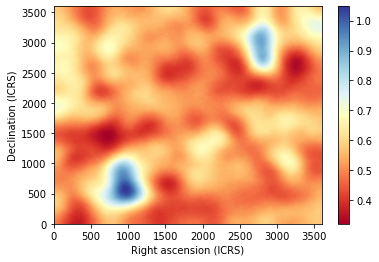

2022-08-13 15:27:26,650 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:26,652 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.04 [MHz] ...
2022-08-13 15:27:27,223 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:27:29,395 : simulate_frequency : INFO : Done simulate map at 127.04 [MHz].
2022-08-13 15:27:29,707 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_127.04.fits']


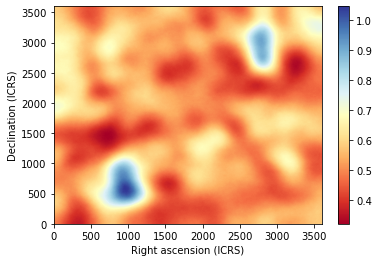

2022-08-13 15:27:32,489 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:32,491 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.20 [MHz] ...
2022-08-13 15:27:33,083 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:27:35,269 : simulate_frequency : INFO : Done simulate map at 127.20 [MHz].
2022-08-13 15:27:35,610 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_127.20.fits']


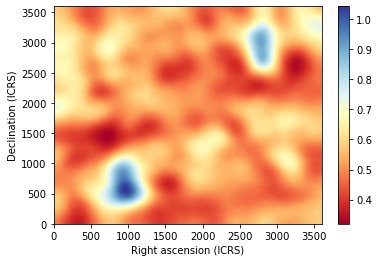

2022-08-13 15:27:37,813 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:37,815 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.36 [MHz] ...
2022-08-13 15:27:38,435 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:27:40,639 : simulate_frequency : INFO : Done simulate map at 127.36 [MHz].
2022-08-13 15:27:40,952 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_127.36.fits']


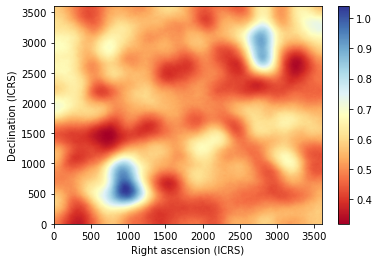

2022-08-13 15:27:43,107 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:43,108 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.52 [MHz] ...
2022-08-13 15:27:43,731 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:27:45,926 : simulate_frequency : INFO : Done simulate map at 127.52 [MHz].
2022-08-13 15:27:46,268 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_127.52.fits']


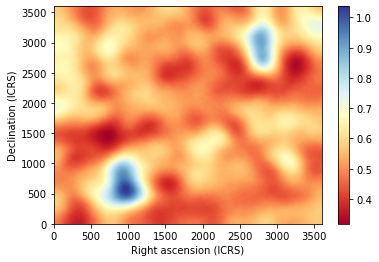

2022-08-13 15:27:48,423 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:48,424 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.68 [MHz] ...
2022-08-13 15:27:49,001 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:27:51,246 : simulate_frequency : INFO : Done simulate map at 127.68 [MHz].
2022-08-13 15:27:51,555 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_127.68.fits']


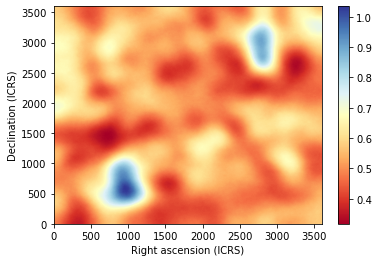

2022-08-13 15:27:53,696 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:53,698 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.84 [MHz] ...
2022-08-13 15:27:54,304 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:27:56,488 : simulate_frequency : INFO : Done simulate map at 127.84 [MHz].
2022-08-13 15:27:56,779 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_127.84.fits']


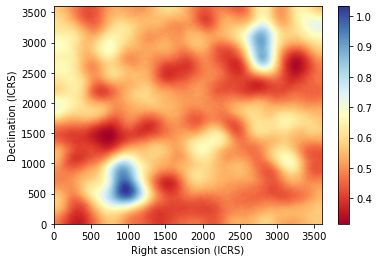

2022-08-13 15:27:58,944 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:58,946 : simulate_frequency : INFO : Simulating Galactic free-free map at 128.00 [MHz] ...
2022-08-13 15:27:59,517 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:28:01,718 : simulate_frequency : INFO : Done simulate map at 128.00 [MHz].
2022-08-13 15:28:02,032 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov4_44-23_128.00.fits']


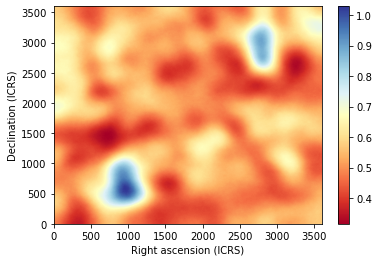

In [26]:
do_simulation(Sfov2.freqs['low']['f'], Sfov2, fov2_outlow)

##### Mid band

2022-08-13 15:28:04,227 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:04,229 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.00 [MHz] ...
2022-08-13 15:28:04,826 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:28:06,995 : simulate_frequency : INFO : Done simulate map at 154.00 [MHz].
2022-08-13 15:28:07,312 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_154.00.fits']


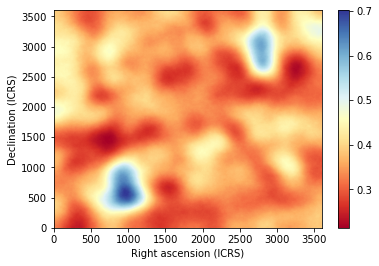

2022-08-13 15:28:09,458 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:09,460 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.16 [MHz] ...
2022-08-13 15:28:10,063 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:28:12,219 : simulate_frequency : INFO : Done simulate map at 154.16 [MHz].
2022-08-13 15:28:12,538 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_154.16.fits']


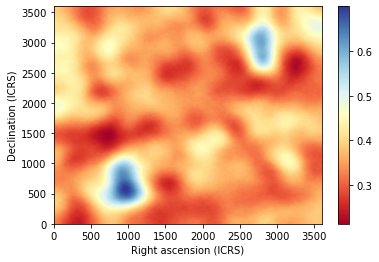

2022-08-13 15:28:14,661 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:14,663 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.32 [MHz] ...
2022-08-13 15:28:15,293 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:28:17,564 : simulate_frequency : INFO : Done simulate map at 154.32 [MHz].
2022-08-13 15:28:17,913 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_154.32.fits']


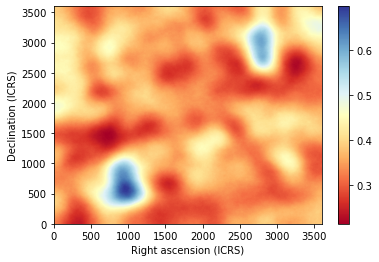

2022-08-13 15:28:20,105 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:20,106 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.48 [MHz] ...
2022-08-13 15:28:20,740 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:28:22,944 : simulate_frequency : INFO : Done simulate map at 154.48 [MHz].
2022-08-13 15:28:23,242 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_154.48.fits']


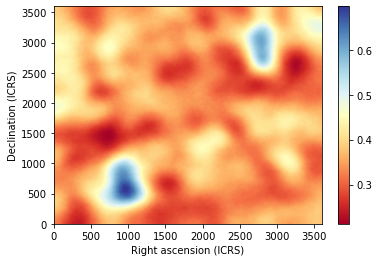

2022-08-13 15:28:25,444 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:25,445 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.64 [MHz] ...
2022-08-13 15:28:26,032 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:28:28,237 : simulate_frequency : INFO : Done simulate map at 154.64 [MHz].
2022-08-13 15:28:28,562 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_154.64.fits']


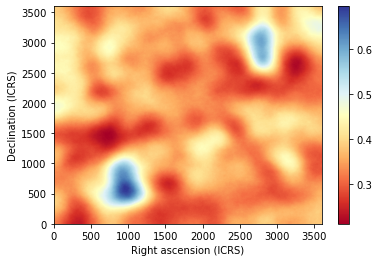

2022-08-13 15:28:31,401 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:31,402 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.80 [MHz] ...
2022-08-13 15:28:32,007 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:28:34,188 : simulate_frequency : INFO : Done simulate map at 154.80 [MHz].
2022-08-13 15:28:34,495 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_154.80.fits']


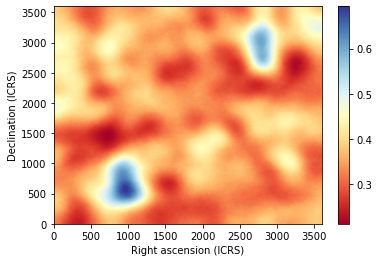

2022-08-13 15:28:36,692 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:36,693 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.96 [MHz] ...
2022-08-13 15:28:37,315 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:28:39,540 : simulate_frequency : INFO : Done simulate map at 154.96 [MHz].
2022-08-13 15:28:39,852 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_154.96.fits']


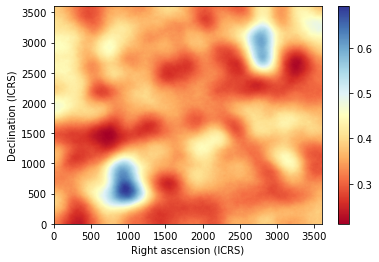

2022-08-13 15:28:41,988 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:41,990 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.12 [MHz] ...
2022-08-13 15:28:42,629 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:28:44,836 : simulate_frequency : INFO : Done simulate map at 155.12 [MHz].
2022-08-13 15:28:45,142 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_155.12.fits']


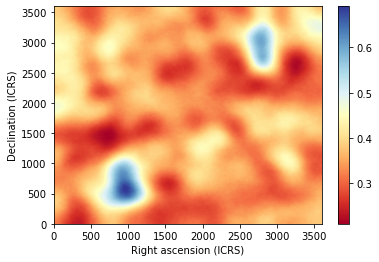

2022-08-13 15:28:47,277 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:47,278 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.28 [MHz] ...
2022-08-13 15:28:47,858 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:28:50,106 : simulate_frequency : INFO : Done simulate map at 155.28 [MHz].
2022-08-13 15:28:50,416 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_155.28.fits']


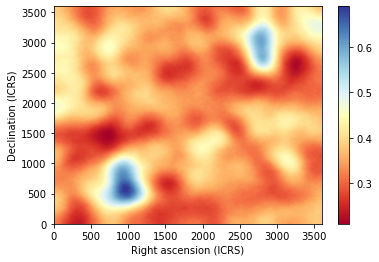

2022-08-13 15:28:52,545 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:52,546 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.44 [MHz] ...
2022-08-13 15:28:53,160 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:28:55,348 : simulate_frequency : INFO : Done simulate map at 155.44 [MHz].
2022-08-13 15:28:55,639 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_155.44.fits']


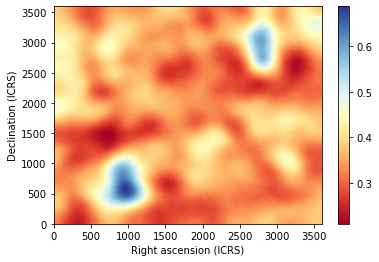

2022-08-13 15:28:57,797 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:57,798 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.60 [MHz] ...
2022-08-13 15:28:58,366 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:29:00,555 : simulate_frequency : INFO : Done simulate map at 155.60 [MHz].
2022-08-13 15:29:00,867 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_155.60.fits']


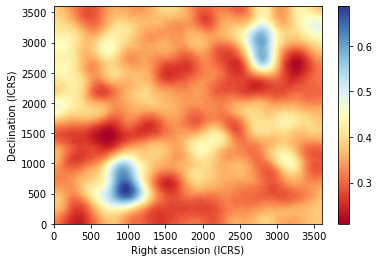

2022-08-13 15:29:03,048 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:03,050 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.76 [MHz] ...
2022-08-13 15:29:03,653 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:29:05,820 : simulate_frequency : INFO : Done simulate map at 155.76 [MHz].
2022-08-13 15:29:06,118 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_155.76.fits']


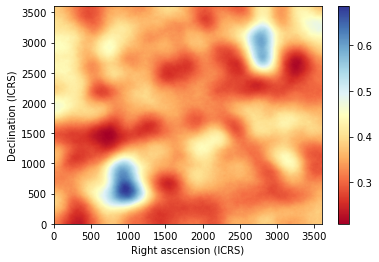

2022-08-13 15:29:08,261 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:08,263 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.92 [MHz] ...
2022-08-13 15:29:08,884 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:29:11,058 : simulate_frequency : INFO : Done simulate map at 155.92 [MHz].
2022-08-13 15:29:11,365 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_155.92.fits']


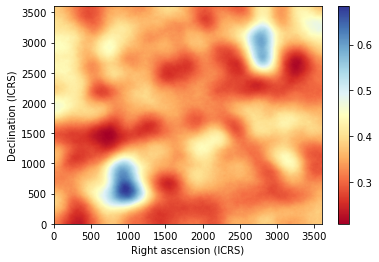

2022-08-13 15:29:13,493 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:13,494 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.08 [MHz] ...
2022-08-13 15:29:14,129 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:29:16,309 : simulate_frequency : INFO : Done simulate map at 156.08 [MHz].
2022-08-13 15:29:16,609 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_156.08.fits']


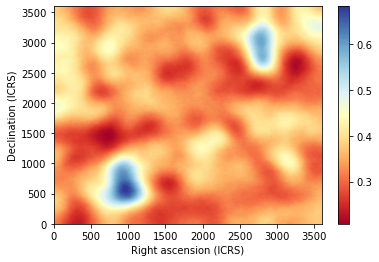

2022-08-13 15:29:18,737 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:18,739 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.24 [MHz] ...
2022-08-13 15:29:19,356 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:29:21,546 : simulate_frequency : INFO : Done simulate map at 156.24 [MHz].
2022-08-13 15:29:21,841 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_156.24.fits']


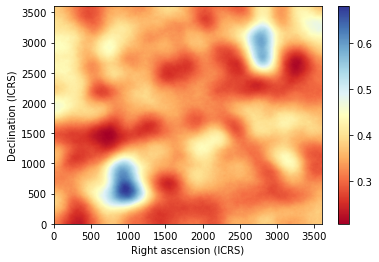

2022-08-13 15:29:23,995 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:23,997 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.40 [MHz] ...
2022-08-13 15:29:24,593 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:29:26,790 : simulate_frequency : INFO : Done simulate map at 156.40 [MHz].
2022-08-13 15:29:27,123 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_156.40.fits']


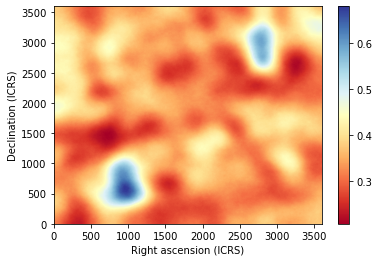

2022-08-13 15:29:30,033 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:30,034 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.56 [MHz] ...
2022-08-13 15:29:30,671 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:29:32,863 : simulate_frequency : INFO : Done simulate map at 156.56 [MHz].
2022-08-13 15:29:33,173 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_156.56.fits']


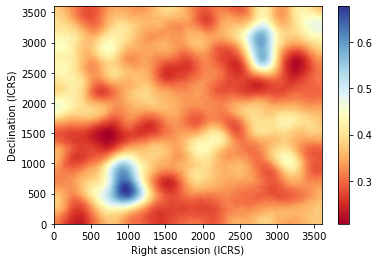

2022-08-13 15:29:35,391 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:35,392 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.72 [MHz] ...
2022-08-13 15:29:36,007 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:29:38,193 : simulate_frequency : INFO : Done simulate map at 156.72 [MHz].
2022-08-13 15:29:38,498 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_156.72.fits']


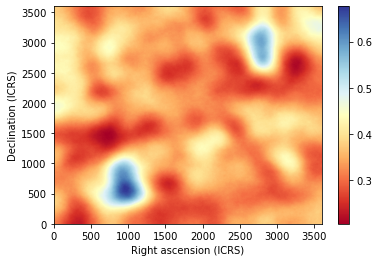

2022-08-13 15:29:40,646 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:40,647 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.88 [MHz] ...
2022-08-13 15:29:41,298 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:29:43,476 : simulate_frequency : INFO : Done simulate map at 156.88 [MHz].
2022-08-13 15:29:43,786 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_156.88.fits']


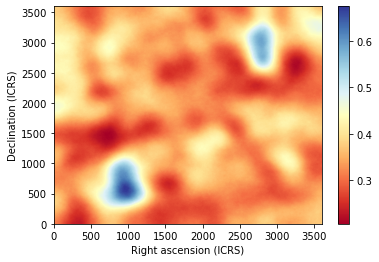

2022-08-13 15:29:45,927 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:45,928 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.04 [MHz] ...
2022-08-13 15:29:46,516 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:29:48,704 : simulate_frequency : INFO : Done simulate map at 157.04 [MHz].
2022-08-13 15:29:49,002 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_157.04.fits']


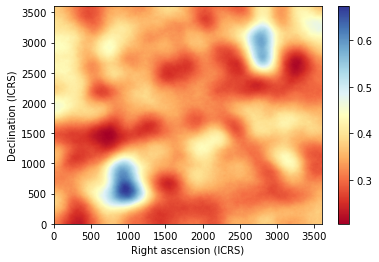

2022-08-13 15:29:51,155 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:51,156 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.20 [MHz] ...
2022-08-13 15:29:51,738 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:29:53,954 : simulate_frequency : INFO : Done simulate map at 157.20 [MHz].
2022-08-13 15:29:54,283 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_157.20.fits']


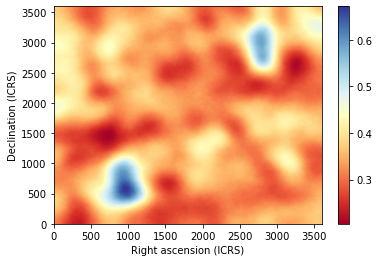

2022-08-13 15:29:56,445 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:56,447 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.36 [MHz] ...
2022-08-13 15:29:57,056 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:29:59,197 : simulate_frequency : INFO : Done simulate map at 157.36 [MHz].
2022-08-13 15:29:59,489 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_157.36.fits']


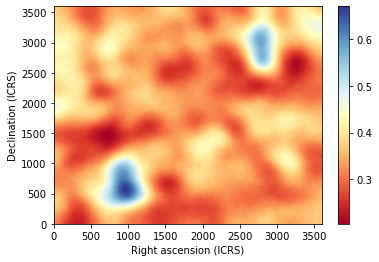

2022-08-13 15:30:01,651 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:01,653 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.52 [MHz] ...
2022-08-13 15:30:02,261 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:30:04,385 : simulate_frequency : INFO : Done simulate map at 157.52 [MHz].
2022-08-13 15:30:04,690 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_157.52.fits']


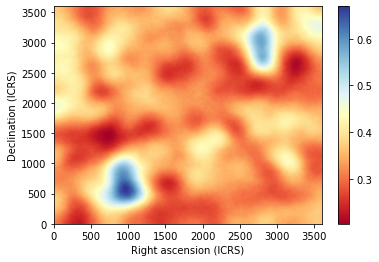

2022-08-13 15:30:06,825 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:06,827 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.68 [MHz] ...
2022-08-13 15:30:07,456 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:30:09,631 : simulate_frequency : INFO : Done simulate map at 157.68 [MHz].
2022-08-13 15:30:09,927 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_157.68.fits']


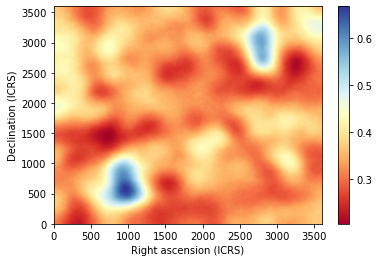

2022-08-13 15:30:12,042 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:12,044 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.84 [MHz] ...
2022-08-13 15:30:12,589 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:30:14,776 : simulate_frequency : INFO : Done simulate map at 157.84 [MHz].
2022-08-13 15:30:15,082 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_157.84.fits']


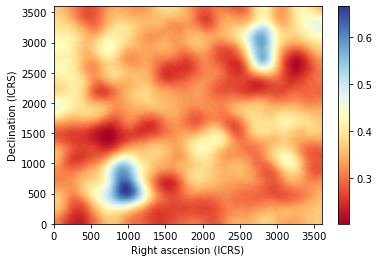

2022-08-13 15:30:17,234 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:17,235 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.00 [MHz] ...
2022-08-13 15:30:17,835 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:30:19,998 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].
2022-08-13 15:30:20,299 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_158.00.fits']


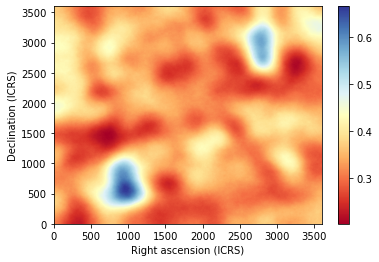

2022-08-13 15:30:22,473 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:22,474 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.16 [MHz] ...
2022-08-13 15:30:23,068 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:30:25,191 : simulate_frequency : INFO : Done simulate map at 158.16 [MHz].
2022-08-13 15:30:25,483 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_158.16.fits']


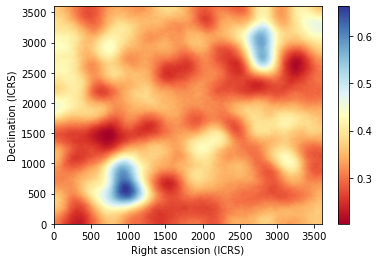

2022-08-13 15:30:28,277 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:28,278 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.32 [MHz] ...
2022-08-13 15:30:28,876 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:30:31,095 : simulate_frequency : INFO : Done simulate map at 158.32 [MHz].
2022-08-13 15:30:31,397 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_158.32.fits']


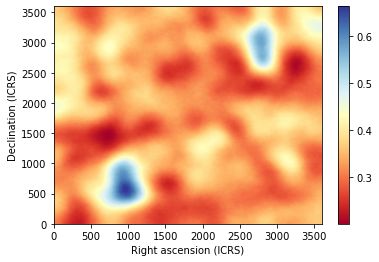

2022-08-13 15:30:33,576 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:33,577 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.48 [MHz] ...
2022-08-13 15:30:34,199 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:30:36,356 : simulate_frequency : INFO : Done simulate map at 158.48 [MHz].
2022-08-13 15:30:36,658 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_158.48.fits']


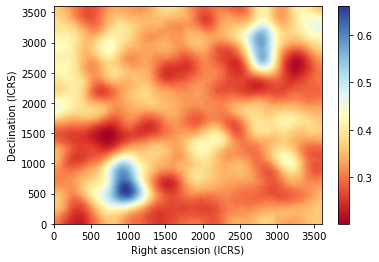

2022-08-13 15:30:38,788 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:38,789 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.64 [MHz] ...
2022-08-13 15:30:39,435 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:30:41,729 : simulate_frequency : INFO : Done simulate map at 158.64 [MHz].
2022-08-13 15:30:42,069 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_158.64.fits']


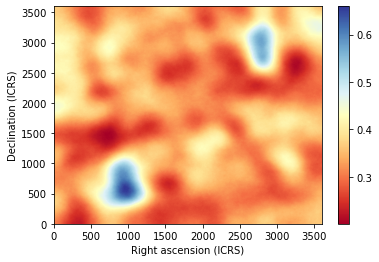

2022-08-13 15:30:44,253 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:44,255 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.80 [MHz] ...
2022-08-13 15:30:44,880 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:30:47,080 : simulate_frequency : INFO : Done simulate map at 158.80 [MHz].
2022-08-13 15:30:47,395 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_158.80.fits']


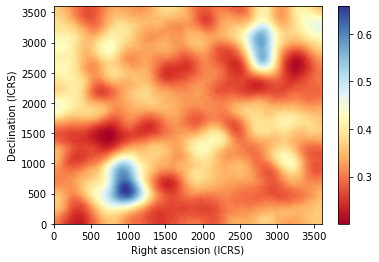

2022-08-13 15:30:49,576 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:49,577 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.96 [MHz] ...
2022-08-13 15:30:50,165 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:30:52,355 : simulate_frequency : INFO : Done simulate map at 158.96 [MHz].
2022-08-13 15:30:52,672 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_158.96.fits']


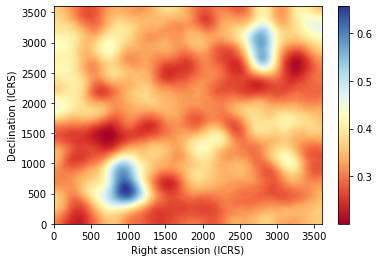

2022-08-13 15:30:54,870 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:54,872 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.12 [MHz] ...
2022-08-13 15:30:55,480 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:30:57,662 : simulate_frequency : INFO : Done simulate map at 159.12 [MHz].
2022-08-13 15:30:57,989 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_159.12.fits']


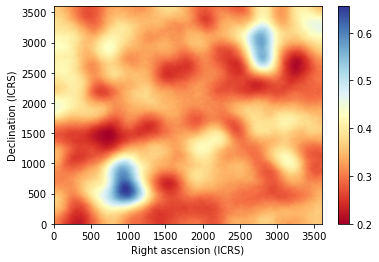

2022-08-13 15:31:00,148 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:00,149 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.28 [MHz] ...
2022-08-13 15:31:00,771 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:31:02,936 : simulate_frequency : INFO : Done simulate map at 159.28 [MHz].
2022-08-13 15:31:03,236 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_159.28.fits']


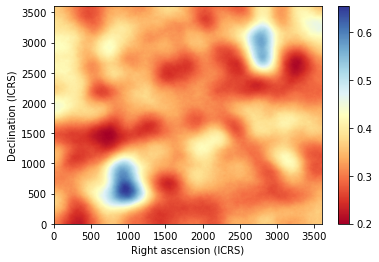

2022-08-13 15:31:05,369 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:05,370 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.44 [MHz] ...
2022-08-13 15:31:06,002 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:31:08,201 : simulate_frequency : INFO : Done simulate map at 159.44 [MHz].
2022-08-13 15:31:08,505 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_159.44.fits']


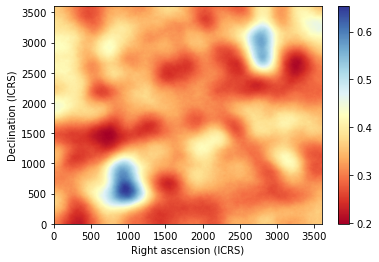

2022-08-13 15:31:10,640 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:10,641 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.60 [MHz] ...
2022-08-13 15:31:11,213 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:31:13,349 : simulate_frequency : INFO : Done simulate map at 159.60 [MHz].
2022-08-13 15:31:13,647 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_159.60.fits']


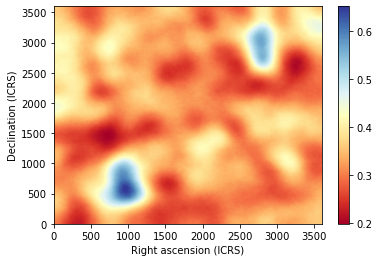

2022-08-13 15:31:15,779 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:15,780 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.76 [MHz] ...
2022-08-13 15:31:16,348 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:31:18,539 : simulate_frequency : INFO : Done simulate map at 159.76 [MHz].
2022-08-13 15:31:18,870 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_159.76.fits']


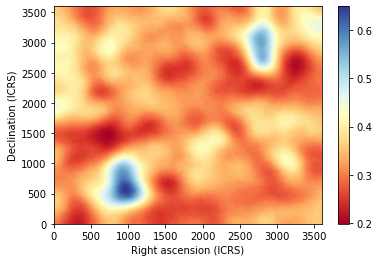

2022-08-13 15:31:21,013 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:21,014 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.92 [MHz] ...
2022-08-13 15:31:21,618 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:31:23,760 : simulate_frequency : INFO : Done simulate map at 159.92 [MHz].
2022-08-13 15:31:24,047 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_159.92.fits']


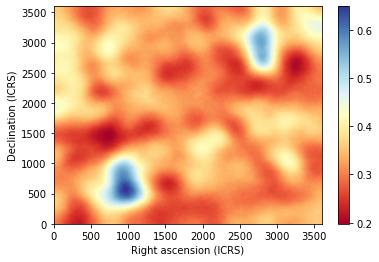

2022-08-13 15:31:26,878 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:26,879 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.08 [MHz] ...
2022-08-13 15:31:27,493 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:31:29,720 : simulate_frequency : INFO : Done simulate map at 160.08 [MHz].
2022-08-13 15:31:30,037 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_160.08.fits']


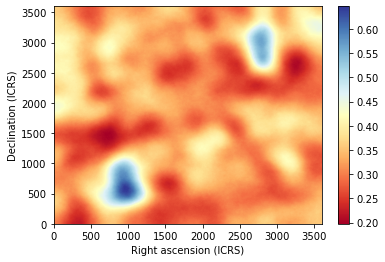

2022-08-13 15:31:32,249 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:32,250 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.24 [MHz] ...
2022-08-13 15:31:32,882 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:31:35,080 : simulate_frequency : INFO : Done simulate map at 160.24 [MHz].
2022-08-13 15:31:35,383 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_160.24.fits']


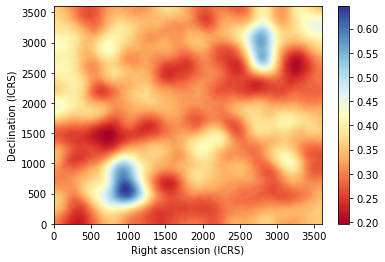

2022-08-13 15:31:37,548 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:37,550 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.40 [MHz] ...
2022-08-13 15:31:38,151 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:31:40,359 : simulate_frequency : INFO : Done simulate map at 160.40 [MHz].
2022-08-13 15:31:40,657 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_160.40.fits']


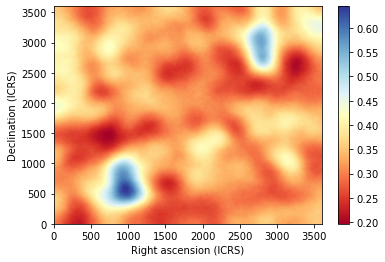

2022-08-13 15:31:42,841 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:42,842 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.56 [MHz] ...
2022-08-13 15:31:43,447 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:31:45,590 : simulate_frequency : INFO : Done simulate map at 160.56 [MHz].
2022-08-13 15:31:45,878 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_160.56.fits']


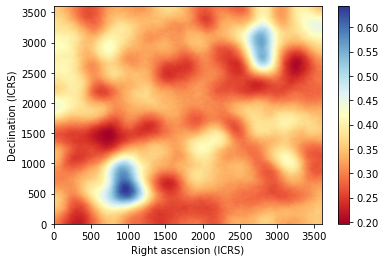

2022-08-13 15:31:48,076 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:48,077 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.72 [MHz] ...
2022-08-13 15:31:48,647 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:31:50,804 : simulate_frequency : INFO : Done simulate map at 160.72 [MHz].
2022-08-13 15:31:51,124 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_160.72.fits']


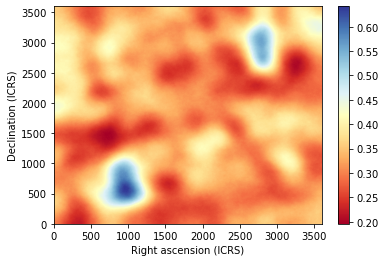

2022-08-13 15:31:53,372 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:53,374 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.88 [MHz] ...
2022-08-13 15:31:54,037 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:31:56,331 : simulate_frequency : INFO : Done simulate map at 160.88 [MHz].
2022-08-13 15:31:56,658 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_160.88.fits']


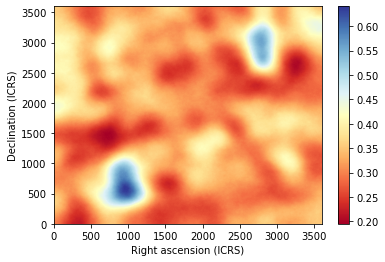

2022-08-13 15:31:58,909 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:58,910 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.04 [MHz] ...
2022-08-13 15:31:59,547 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:32:01,757 : simulate_frequency : INFO : Done simulate map at 161.04 [MHz].
2022-08-13 15:32:02,078 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_161.04.fits']


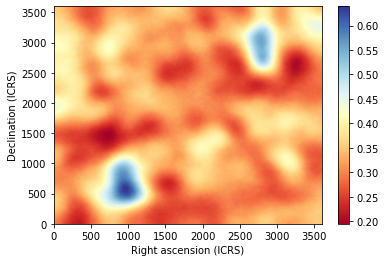

2022-08-13 15:32:04,240 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:04,241 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.20 [MHz] ...
2022-08-13 15:32:04,856 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:32:07,086 : simulate_frequency : INFO : Done simulate map at 161.20 [MHz].
2022-08-13 15:32:07,394 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_161.20.fits']


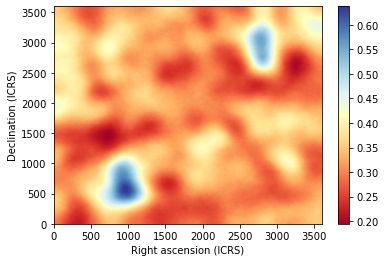

2022-08-13 15:32:09,559 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:09,561 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.36 [MHz] ...
2022-08-13 15:32:10,171 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:32:12,322 : simulate_frequency : INFO : Done simulate map at 161.36 [MHz].
2022-08-13 15:32:12,629 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_161.36.fits']


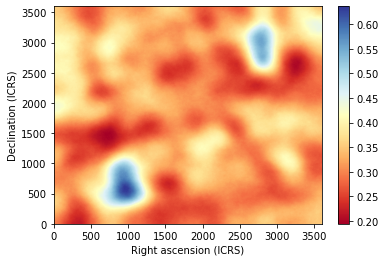

2022-08-13 15:32:14,798 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:14,800 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.52 [MHz] ...
2022-08-13 15:32:15,373 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:32:17,539 : simulate_frequency : INFO : Done simulate map at 161.52 [MHz].
2022-08-13 15:32:17,864 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_161.52.fits']


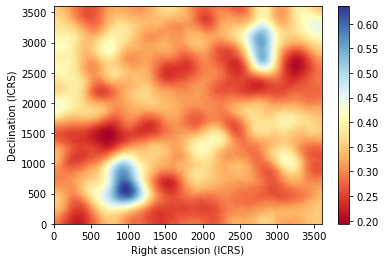

2022-08-13 15:32:20,041 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:20,042 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.68 [MHz] ...
2022-08-13 15:32:20,649 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:32:22,809 : simulate_frequency : INFO : Done simulate map at 161.68 [MHz].
2022-08-13 15:32:23,100 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_161.68.fits']


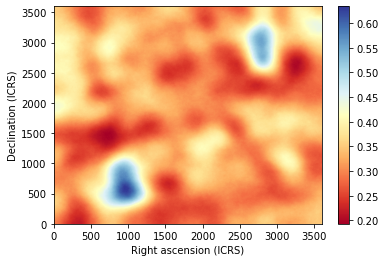

2022-08-13 15:32:26,008 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:26,009 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.84 [MHz] ...
2022-08-13 15:32:26,612 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:32:28,827 : simulate_frequency : INFO : Done simulate map at 161.84 [MHz].
2022-08-13 15:32:29,149 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_161.84.fits']


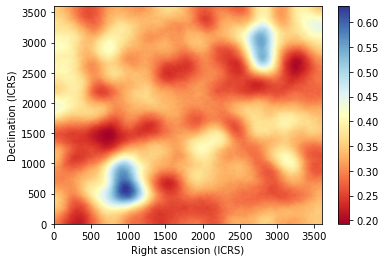

2022-08-13 15:32:31,364 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:31,365 : simulate_frequency : INFO : Simulating Galactic free-free map at 162.00 [MHz] ...
2022-08-13 15:32:32,000 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:32:34,195 : simulate_frequency : INFO : Done simulate map at 162.00 [MHz].
2022-08-13 15:32:34,503 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov4_44-23_162.00.fits']


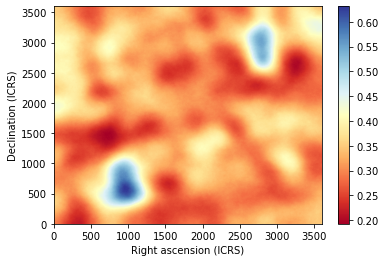

In [27]:
do_simulation(Sfov2.freqs['mid']['f'], Sfov2, fov2_outmid)

##### hig band

2022-08-13 15:32:36,678 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:36,679 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.00 [MHz] ...
2022-08-13 15:32:37,269 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:32:39,486 : simulate_frequency : INFO : Done simulate map at 188.00 [MHz].
2022-08-13 15:32:39,795 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_188.00.fits']


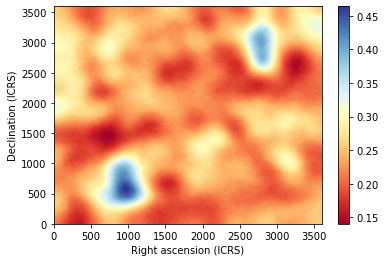

2022-08-13 15:32:41,958 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:41,960 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.16 [MHz] ...
2022-08-13 15:32:42,570 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:32:44,712 : simulate_frequency : INFO : Done simulate map at 188.16 [MHz].
2022-08-13 15:32:45,003 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_188.16.fits']


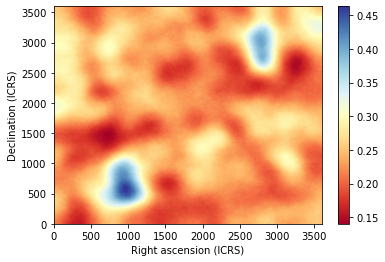

2022-08-13 15:32:47,181 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:47,182 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.32 [MHz] ...
2022-08-13 15:32:47,757 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:32:49,905 : simulate_frequency : INFO : Done simulate map at 188.32 [MHz].
2022-08-13 15:32:50,222 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_188.32.fits']


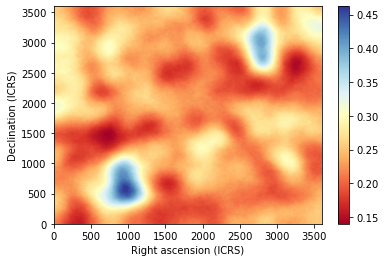

2022-08-13 15:32:52,425 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:52,426 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.48 [MHz] ...
2022-08-13 15:32:53,032 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:32:55,196 : simulate_frequency : INFO : Done simulate map at 188.48 [MHz].
2022-08-13 15:32:55,492 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_188.48.fits']


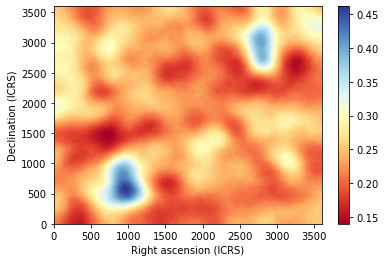

2022-08-13 15:32:57,645 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:57,646 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.64 [MHz] ...
2022-08-13 15:32:58,262 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:33:00,423 : simulate_frequency : INFO : Done simulate map at 188.64 [MHz].
2022-08-13 15:33:00,716 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_188.64.fits']


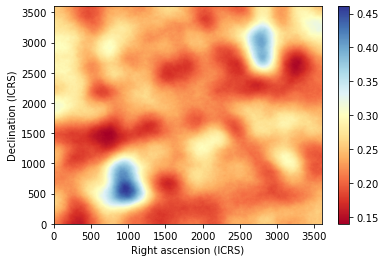

2022-08-13 15:33:02,859 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:02,861 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.80 [MHz] ...
2022-08-13 15:33:03,501 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:33:05,780 : simulate_frequency : INFO : Done simulate map at 188.80 [MHz].
2022-08-13 15:33:06,122 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_188.80.fits']


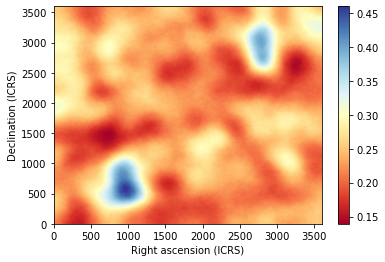

2022-08-13 15:33:08,326 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:08,327 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.96 [MHz] ...
2022-08-13 15:33:08,963 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:33:11,139 : simulate_frequency : INFO : Done simulate map at 188.96 [MHz].
2022-08-13 15:33:11,447 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_188.96.fits']


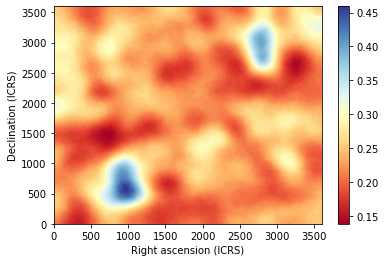

2022-08-13 15:33:13,643 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:13,644 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.12 [MHz] ...
2022-08-13 15:33:14,226 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:33:16,410 : simulate_frequency : INFO : Done simulate map at 189.12 [MHz].
2022-08-13 15:33:16,728 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_189.12.fits']


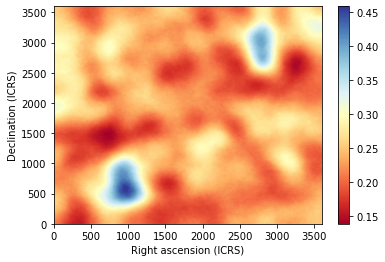

2022-08-13 15:33:18,942 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:18,943 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.28 [MHz] ...
2022-08-13 15:33:19,554 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:33:21,717 : simulate_frequency : INFO : Done simulate map at 189.28 [MHz].
2022-08-13 15:33:22,061 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_189.28.fits']


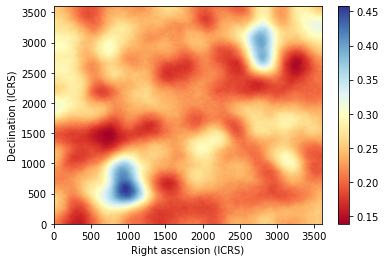

2022-08-13 15:33:24,930 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:24,931 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.44 [MHz] ...
2022-08-13 15:33:25,536 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:33:27,745 : simulate_frequency : INFO : Done simulate map at 189.44 [MHz].
2022-08-13 15:33:28,071 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_189.44.fits']


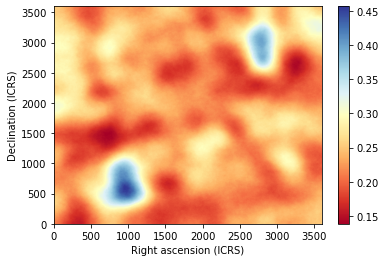

2022-08-13 15:33:30,235 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:30,236 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.60 [MHz] ...
2022-08-13 15:33:30,889 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:33:33,121 : simulate_frequency : INFO : Done simulate map at 189.60 [MHz].
2022-08-13 15:33:33,431 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_189.60.fits']


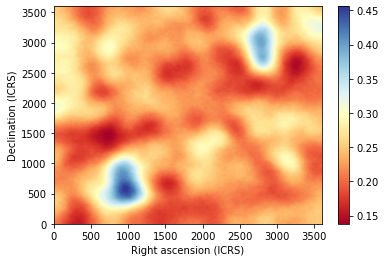

2022-08-13 15:33:35,588 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:35,589 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.76 [MHz] ...
2022-08-13 15:33:36,168 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:33:38,396 : simulate_frequency : INFO : Done simulate map at 189.76 [MHz].
2022-08-13 15:33:38,699 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_189.76.fits']


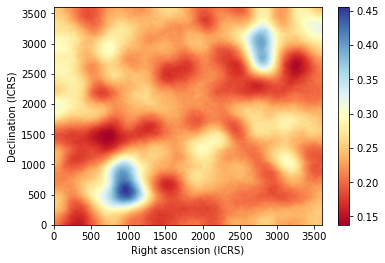

2022-08-13 15:33:40,844 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:40,845 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.92 [MHz] ...
2022-08-13 15:33:41,457 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:33:43,612 : simulate_frequency : INFO : Done simulate map at 189.92 [MHz].
2022-08-13 15:33:43,910 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_189.92.fits']


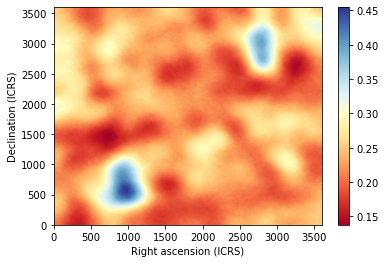

2022-08-13 15:33:46,059 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:46,061 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.08 [MHz] ...
2022-08-13 15:33:46,628 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:33:48,752 : simulate_frequency : INFO : Done simulate map at 190.08 [MHz].
2022-08-13 15:33:49,055 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_190.08.fits']


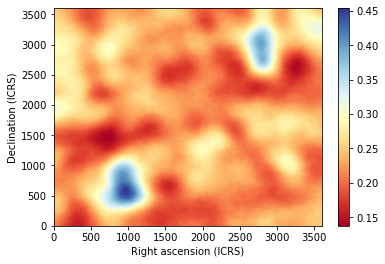

2022-08-13 15:33:51,229 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:51,231 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.24 [MHz] ...
2022-08-13 15:33:51,819 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:33:53,980 : simulate_frequency : INFO : Done simulate map at 190.24 [MHz].
2022-08-13 15:33:54,292 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_190.24.fits']


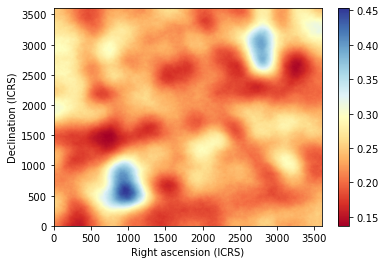

2022-08-13 15:33:56,443 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:56,444 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.40 [MHz] ...
2022-08-13 15:33:57,059 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:33:59,203 : simulate_frequency : INFO : Done simulate map at 190.40 [MHz].
2022-08-13 15:33:59,498 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_190.40.fits']


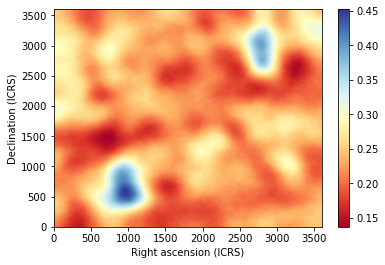

2022-08-13 15:34:01,640 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:01,641 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.56 [MHz] ...
2022-08-13 15:34:02,255 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:34:04,456 : simulate_frequency : INFO : Done simulate map at 190.56 [MHz].
2022-08-13 15:34:04,761 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_190.56.fits']


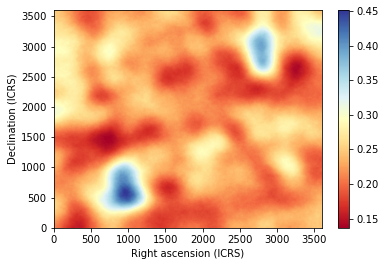

2022-08-13 15:34:06,901 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:06,902 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.72 [MHz] ...
2022-08-13 15:34:07,482 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:34:09,618 : simulate_frequency : INFO : Done simulate map at 190.72 [MHz].
2022-08-13 15:34:09,914 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_190.72.fits']


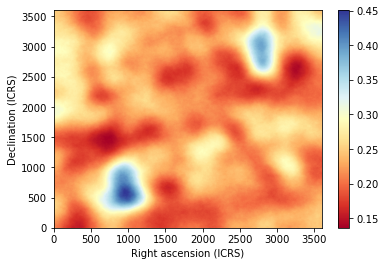

2022-08-13 15:34:12,051 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:12,052 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.88 [MHz] ...
2022-08-13 15:34:12,616 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:34:14,791 : simulate_frequency : INFO : Done simulate map at 190.88 [MHz].
2022-08-13 15:34:15,113 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_190.88.fits']


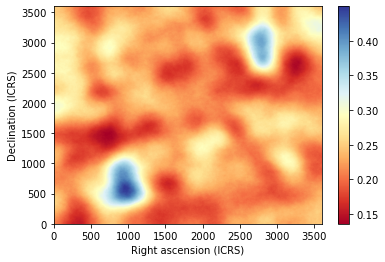

2022-08-13 15:34:17,334 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:17,336 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.04 [MHz] ...
2022-08-13 15:34:17,990 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:34:20,272 : simulate_frequency : INFO : Done simulate map at 191.04 [MHz].
2022-08-13 15:34:20,613 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_191.04.fits']


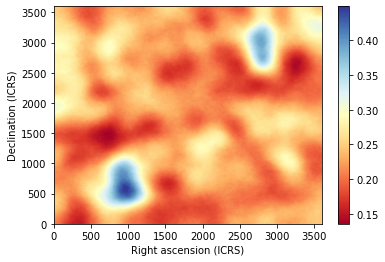

2022-08-13 15:34:23,458 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:23,459 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.20 [MHz] ...
2022-08-13 15:34:24,103 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:34:26,285 : simulate_frequency : INFO : Done simulate map at 191.20 [MHz].
2022-08-13 15:34:26,610 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_191.20.fits']


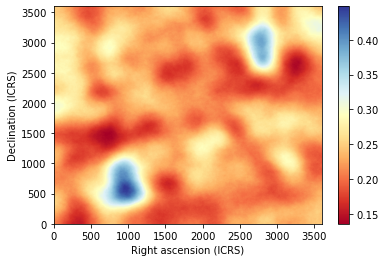

2022-08-13 15:34:28,768 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:28,769 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.36 [MHz] ...
2022-08-13 15:34:29,426 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:34:31,645 : simulate_frequency : INFO : Done simulate map at 191.36 [MHz].
2022-08-13 15:34:31,966 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_191.36.fits']


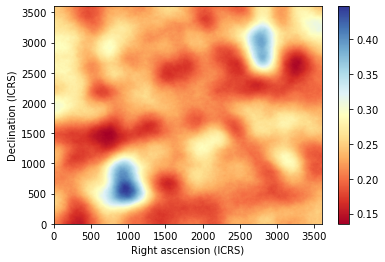

2022-08-13 15:34:34,141 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:34,142 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.52 [MHz] ...
2022-08-13 15:34:34,719 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:34:36,914 : simulate_frequency : INFO : Done simulate map at 191.52 [MHz].
2022-08-13 15:34:37,231 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_191.52.fits']


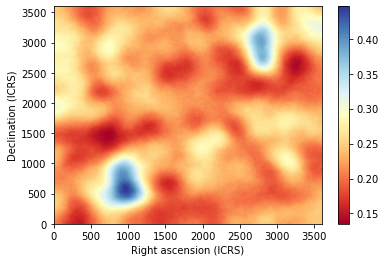

2022-08-13 15:34:39,387 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:39,388 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.68 [MHz] ...
2022-08-13 15:34:39,991 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:34:42,210 : simulate_frequency : INFO : Done simulate map at 191.68 [MHz].
2022-08-13 15:34:42,518 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_191.68.fits']


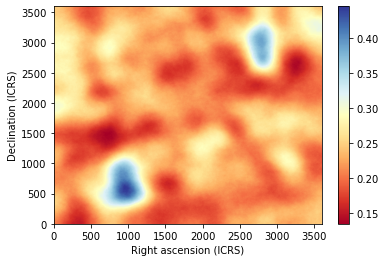

2022-08-13 15:34:44,672 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:44,673 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.84 [MHz] ...
2022-08-13 15:34:45,257 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:34:47,389 : simulate_frequency : INFO : Done simulate map at 191.84 [MHz].
2022-08-13 15:34:47,681 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_191.84.fits']


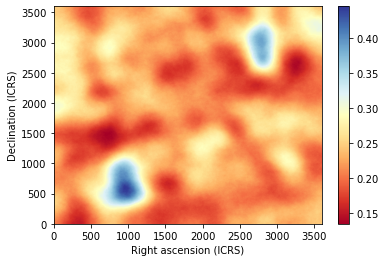

2022-08-13 15:34:49,882 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:49,883 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.00 [MHz] ...
2022-08-13 15:34:50,496 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:34:52,650 : simulate_frequency : INFO : Done simulate map at 192.00 [MHz].
2022-08-13 15:34:52,954 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_192.00.fits']


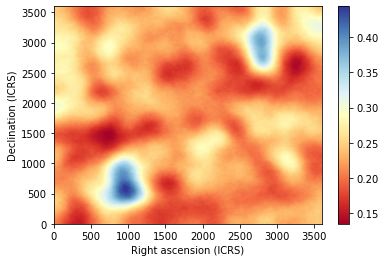

2022-08-13 15:34:54,830 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:54,833 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.16 [MHz] ...
2022-08-13 15:34:55,067 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:34:56,455 : simulate_frequency : INFO : Done simulate map at 192.16 [MHz].
2022-08-13 15:34:56,589 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_192.16.fits']


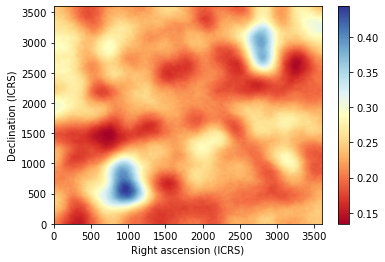

2022-08-13 15:34:57,888 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:57,890 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.32 [MHz] ...
2022-08-13 15:34:58,096 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:34:59,465 : simulate_frequency : INFO : Done simulate map at 192.32 [MHz].
2022-08-13 15:34:59,576 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_192.32.fits']


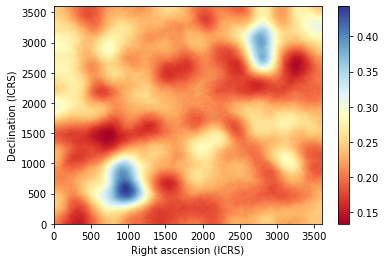

2022-08-13 15:35:00,866 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:00,868 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.48 [MHz] ...
2022-08-13 15:35:01,074 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:02,442 : simulate_frequency : INFO : Done simulate map at 192.48 [MHz].
2022-08-13 15:35:02,551 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_192.48.fits']


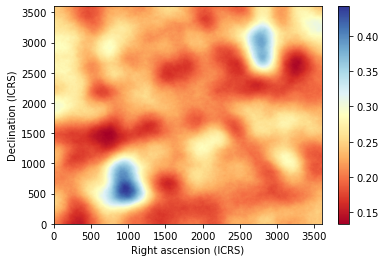

2022-08-13 15:35:03,842 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:03,844 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.64 [MHz] ...
2022-08-13 15:35:04,051 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:05,419 : simulate_frequency : INFO : Done simulate map at 192.64 [MHz].
2022-08-13 15:35:05,523 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_192.64.fits']


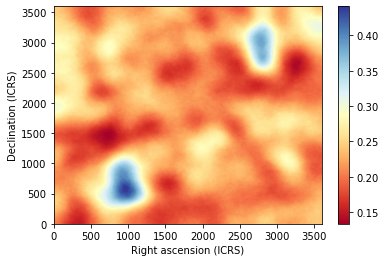

2022-08-13 15:35:06,814 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:06,816 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.80 [MHz] ...
2022-08-13 15:35:07,024 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:08,393 : simulate_frequency : INFO : Done simulate map at 192.80 [MHz].
2022-08-13 15:35:08,525 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_192.80.fits']


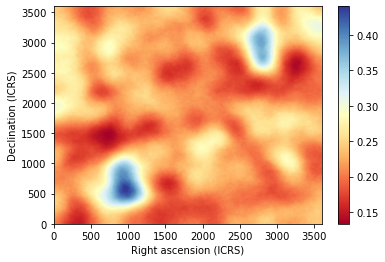

2022-08-13 15:35:10,573 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:10,575 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.96 [MHz] ...
2022-08-13 15:35:10,780 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:12,145 : simulate_frequency : INFO : Done simulate map at 192.96 [MHz].
2022-08-13 15:35:12,250 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_192.96.fits']


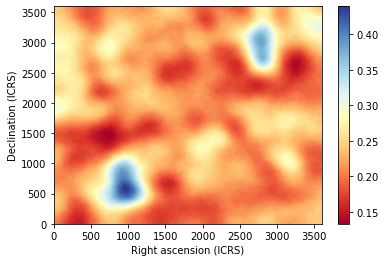

2022-08-13 15:35:13,549 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:13,551 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.12 [MHz] ...
2022-08-13 15:35:13,762 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:15,129 : simulate_frequency : INFO : Done simulate map at 193.12 [MHz].
2022-08-13 15:35:15,219 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_193.12.fits']


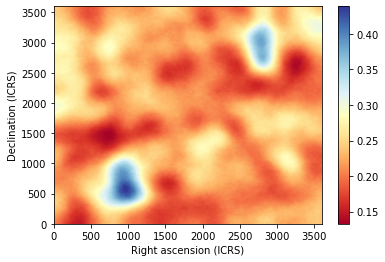

2022-08-13 15:35:16,516 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:16,518 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.28 [MHz] ...
2022-08-13 15:35:16,724 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:18,088 : simulate_frequency : INFO : Done simulate map at 193.28 [MHz].
2022-08-13 15:35:18,178 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_193.28.fits']


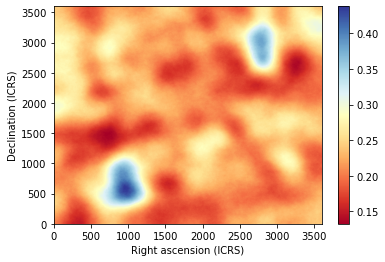

2022-08-13 15:35:19,474 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:19,476 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.44 [MHz] ...
2022-08-13 15:35:19,683 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:21,049 : simulate_frequency : INFO : Done simulate map at 193.44 [MHz].
2022-08-13 15:35:21,146 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_193.44.fits']


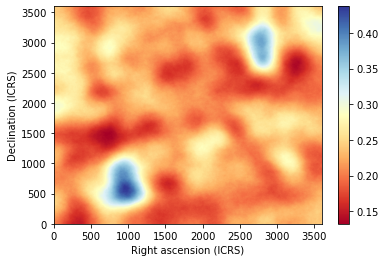

2022-08-13 15:35:22,443 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:22,445 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.60 [MHz] ...
2022-08-13 15:35:22,652 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:24,018 : simulate_frequency : INFO : Done simulate map at 193.60 [MHz].
2022-08-13 15:35:24,128 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_193.60.fits']


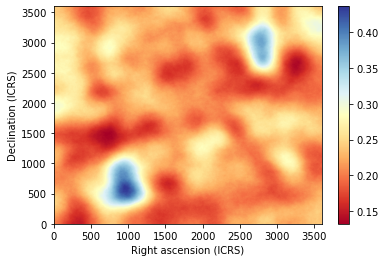

2022-08-13 15:35:25,422 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:25,424 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.76 [MHz] ...
2022-08-13 15:35:25,631 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:27,032 : simulate_frequency : INFO : Done simulate map at 193.76 [MHz].
2022-08-13 15:35:27,143 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_193.76.fits']


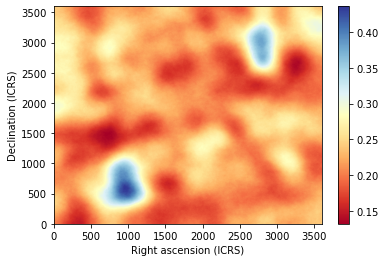

2022-08-13 15:35:28,437 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:28,439 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.92 [MHz] ...
2022-08-13 15:35:28,646 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:30,050 : simulate_frequency : INFO : Done simulate map at 193.92 [MHz].
2022-08-13 15:35:30,139 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_193.92.fits']


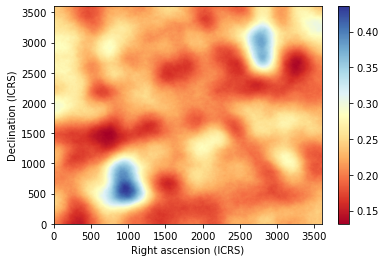

2022-08-13 15:35:31,433 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:31,435 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.08 [MHz] ...
2022-08-13 15:35:31,642 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:33,063 : simulate_frequency : INFO : Done simulate map at 194.08 [MHz].
2022-08-13 15:35:33,153 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_194.08.fits']


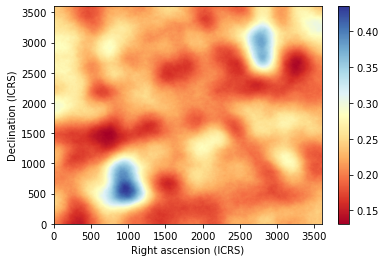

2022-08-13 15:35:34,446 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:34,448 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.24 [MHz] ...
2022-08-13 15:35:34,655 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:36,078 : simulate_frequency : INFO : Done simulate map at 194.24 [MHz].
2022-08-13 15:35:36,167 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_194.24.fits']


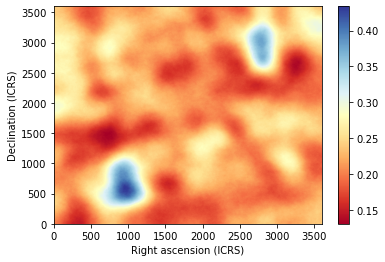

2022-08-13 15:35:37,460 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:37,462 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.40 [MHz] ...
2022-08-13 15:35:37,671 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:39,096 : simulate_frequency : INFO : Done simulate map at 194.40 [MHz].
2022-08-13 15:35:39,187 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_194.40.fits']


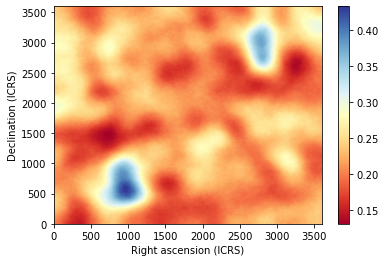

2022-08-13 15:35:40,481 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:40,483 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.56 [MHz] ...
2022-08-13 15:35:40,688 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:42,111 : simulate_frequency : INFO : Done simulate map at 194.56 [MHz].
2022-08-13 15:35:42,201 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_194.56.fits']


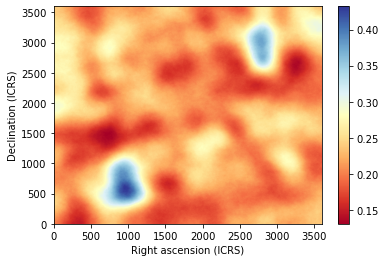

2022-08-13 15:35:44,110 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:44,112 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.72 [MHz] ...
2022-08-13 15:35:44,317 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:45,683 : simulate_frequency : INFO : Done simulate map at 194.72 [MHz].
2022-08-13 15:35:45,774 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_194.72.fits']


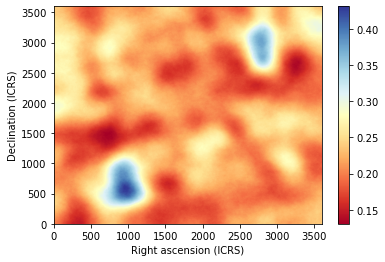

2022-08-13 15:35:47,073 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:47,075 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.88 [MHz] ...
2022-08-13 15:35:47,283 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:48,648 : simulate_frequency : INFO : Done simulate map at 194.88 [MHz].
2022-08-13 15:35:48,738 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_194.88.fits']


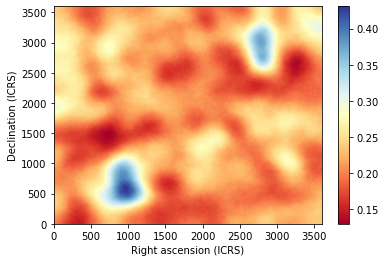

2022-08-13 15:35:50,034 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:50,036 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.04 [MHz] ...
2022-08-13 15:35:50,243 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:51,608 : simulate_frequency : INFO : Done simulate map at 195.04 [MHz].
2022-08-13 15:35:51,698 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_195.04.fits']


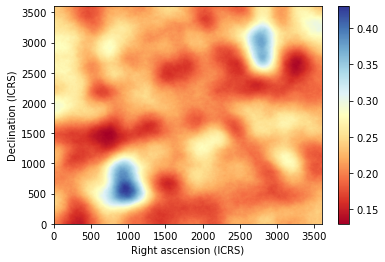

2022-08-13 15:35:52,994 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:52,996 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.20 [MHz] ...
2022-08-13 15:35:53,204 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:54,570 : simulate_frequency : INFO : Done simulate map at 195.20 [MHz].
2022-08-13 15:35:54,659 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_195.20.fits']


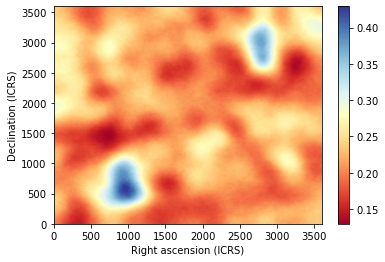

2022-08-13 15:35:55,957 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:55,959 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.36 [MHz] ...
2022-08-13 15:35:56,168 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:35:57,533 : simulate_frequency : INFO : Done simulate map at 195.36 [MHz].
2022-08-13 15:35:57,621 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_195.36.fits']


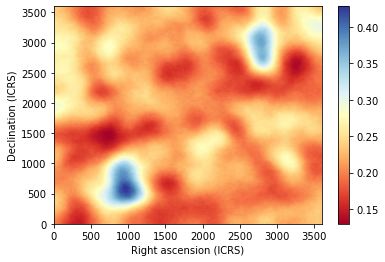

2022-08-13 15:35:58,916 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:58,918 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.52 [MHz] ...
2022-08-13 15:35:59,123 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:36:00,518 : simulate_frequency : INFO : Done simulate map at 195.52 [MHz].
2022-08-13 15:36:00,606 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_195.52.fits']


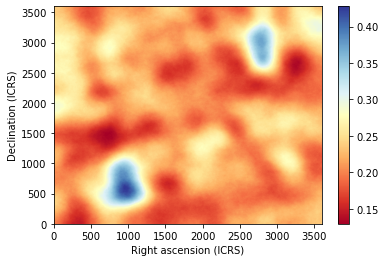

2022-08-13 15:36:01,899 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:36:01,901 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.68 [MHz] ...
2022-08-13 15:36:02,108 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:36:03,533 : simulate_frequency : INFO : Done simulate map at 195.68 [MHz].
2022-08-13 15:36:03,622 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_195.68.fits']


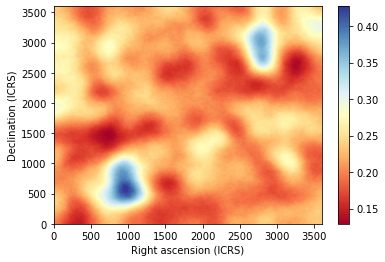

2022-08-13 15:36:04,919 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:36:04,921 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.84 [MHz] ...
2022-08-13 15:36:05,127 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:36:06,549 : simulate_frequency : INFO : Done simulate map at 195.84 [MHz].
2022-08-13 15:36:06,637 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_195.84.fits']


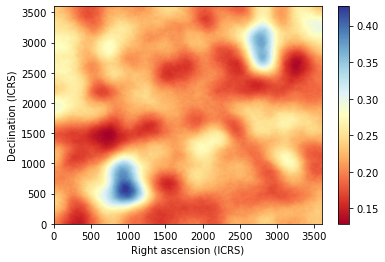

2022-08-13 15:36:07,929 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:36:07,931 : simulate_frequency : INFO : Simulating Galactic free-free map at 196.00 [MHz] ...
2022-08-13 15:36:08,138 : add_ss : INFO : The small scale map is generated using alpha=0.004061939488443293, beta=0.27615600152130587.
2022-08-13 15:36:09,563 : simulate_frequency : INFO : Done simulate map at 196.00 [MHz].
2022-08-13 15:36:09,652 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov4_44-23_196.00.fits']


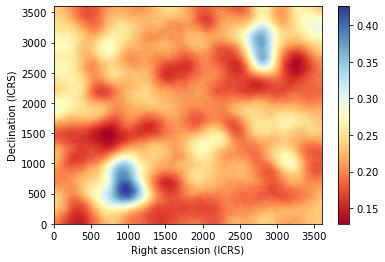

In [28]:
do_simulation(Sfov2.freqs['hig']['f'], Sfov2, fov2_outhig)